# Feature space: non-ML

What kind of features are most predictive of mutational stability?

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import os
import corner
import sys
from copy import deepcopy

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


if __package__ is None:

    module_path = os.path.abspath(os.path.join('..'))
    sys.path.append(module_path)

    __package__ = os.path.basename(module_path)


from src.srv.sequence_exploration.sequence_analysis import b_tabulate_mutation_info
from src.utils.data.data_format_tools.common import load_json_as_dict
from src.utils.common.setup_new import prepare_config
from src.utils.circuit.agnostic_circuits.circuit_manager_new import CircuitModeller
from src.utils.evolution.evolver import Evolver
from src.utils.misc.numerical import count_monotonic_group_lengths, find_monotonic_group_idxs, is_within_range
from src.utils.misc.string_handling import string_to_tuple_list
from src.utils.misc.type_handling import flatten_listlike, get_first_elements
from src.utils.results.analytics.naming import get_analytics_types_all, get_true_names_analytics, get_true_interaction_cols
from tests_local.shared import create_test_inputs, CONFIG, TEST_CONFIG, five_circuits, mutate, simulate

# config = load_json_as_dict('../tests_local/configs/simple_circuit.json')
SEQ_LENGTH = 20
config = deepcopy(CONFIG)


In [3]:
# fn = '../data/ensemble_mutation_effect_analysis/2023_04_05_223653/summarise_simulation/tabulated_mutation_info.csv'
fn = '../data/ensemble_mutation_effect_analysis/2023_04_11_091040/summarise_simulation/tabulated_mutation_info.csv'
info = pd.read_csv(fn)

In [4]:
# circuits, config, result_writer, info = create_test_inputs(deepcopy(CONFIG))

# circuits, config, data_writer = five_circuits(config, data_writer=None)

In [5]:

# circuits, config, data_writer = mutate(circuits, config, data_writer)

In [6]:

# circuits, config, data_writer = simulate(circuits, config, data_writer)

In [7]:


# info = b_tabulate_mutation_info(data_writer.ensemble_write_dir,
#                                 data_writer=data_writer, experiment_config=config)

In [8]:
# circuits = [Evolver(data_writer=result_writer,
#                     sequence_type=config.get('system_type')).mutate(
#             c,
#             write_to_subsystem=True,
#             algorithm=config.get('mutations', {}).get('algorithm', 'random')) for c in circuits]
# circuit_modeller = CircuitModeller(result_writer=result_writer, config=config)
# circuits = circuit_modeller.batch_circuits(
#     circuits=circuits,
#     methods={
#         "compute_interactions": {},
#         "init_circuits": {'batch': True},
#         'simulate_signal_batch': {'ref_circuit': None,
#                                   'batch': config['simulation']['use_batch_mutations']},
#         'write_results': {'no_visualisations': False, # config['experiment']['no_visualisations'],
#                           'no_numerical': False} #config['experiment']['no_numerical']}
#     }
# )



In [9]:
# circuits[1].interactions.__dict__

## Process summary

In [10]:
num_group_cols = [e.replace('energies', 'binding_sites_groups') for e in get_true_interaction_cols(info, 'energies')]
num_bs_cols = [e.replace('energies', 'binding_sites_count') for e in get_true_interaction_cols(info, 'energies')]
bs_idxs_cols = [e.replace('energies', 'binding_sites_idxs') for e in get_true_interaction_cols(info, 'energies')]
bs_range_cols = [e.replace('energies', 'binding_site_group_range') for e in get_true_interaction_cols(info, 'energies')]



In [11]:
for b, g, bs, bsi, r in zip(get_true_interaction_cols(info, 'binding_sites'), num_group_cols, num_bs_cols, bs_idxs_cols, bs_range_cols):
    fbs = [string_to_tuple_list(bb) for bb in info[b]]
    first = get_first_elements(fbs, empty_replacement=[])
    info[bs] = [count_monotonic_group_lengths(bb) for bb in first]
    info[bsi] = [find_monotonic_group_idxs(bb) for bb in first]
    info[g] = info[bs].apply(len)
    info[r] = [[(bb[0], bb[-1]) for bb in b] for b in info[bsi]]


In [12]:
good_cols = list(info.columns)
[good_cols.remove(x) for x in get_true_interaction_cols(info, 'binding_rates_dissociation') + get_true_interaction_cols(info, 'eqconstants') +
 get_true_interaction_cols(info, 'energies') + get_true_interaction_cols(info, 'binding_sites') + num_group_cols + num_bs_cols]
good_cols


['circuit_name',
 'mutation_name',
 'mutation_num',
 'mutation_type',
 'mutation_positions',
 'path_to_template_circuit',
 'name',
 'interacting',
 'self_interacting',
 'num_interacting',
 'num_self_interacting',
 'num_interacting_diff_to_base_circuit',
 'num_self_interacting_diff_to_base_circuit',
 'num_interacting_ratio_from_mutation_to_base',
 'num_self_interacting_ratio_from_mutation_to_base',
 'fold_change',
 'final_deriv',
 'initial_steady_states',
 'max_amount',
 'min_amount',
 'overshoot',
 'RMSE',
 'steady_states',
 'response_time_wrt_species-6',
 'response_time_wrt_species-6_diff_to_base_circuit',
 'response_time_wrt_species-6_ratio_from_mutation_to_base',
 'precision_wrt_species-6',
 'precision_wrt_species-6_diff_to_base_circuit',
 'precision_wrt_species-6_ratio_from_mutation_to_base',
 'sensitivity_wrt_species-6',
 'sensitivity_wrt_species-6_diff_to_base_circuit',
 'sensitivity_wrt_species-6_ratio_from_mutation_to_base',
 'fold_change_diff_to_base_circuit',
 'final_deriv_di

In [13]:
binding_idx_map = {e.replace('energies_', ''): i for i, e in enumerate(get_true_interaction_cols(info, 'energies'))}

In [14]:
infom = info.melt(good_cols, value_vars=get_true_interaction_cols(info, 'energies'), var_name='energies_idx', value_name='energies')
dfm = info.melt(good_cols, value_vars=num_group_cols, var_name='num_groups_idx', value_name='num_groups')
infom['idx_species_binding'] = dfm['num_groups_idx'].apply(lambda x: binding_idx_map[x.replace('binding_sites_groups_', '')])
infom['num_groups'] = dfm['num_groups']
dfm = info.melt(good_cols, value_vars=num_bs_cols, var_name='num_bs_idx', value_name='num_bs')
infom['num_bs'] = dfm['num_bs']

for k in ['binding_sites', 'binding_rates_dissociation', 'eqconstants']:
    dfm = info.melt(good_cols, value_vars=get_true_interaction_cols(info, k), var_name=f'{k}_idx', value_name=k)
    infom[k] = dfm[k]


Energy diffs

In [98]:
for k in ['binding_rates_dissociation', 'eqconstants', 'energies']:
    infom[f'{k}_diffs'] = info.groupby(['circuit_name'])[get_true_interaction_cols(info, f'{k}')].apply(lambda x: x - x.iloc[0]).melt(value_vars=get_true_interaction_cols(info, f'{k}'), var_name='idx', value_name=f'{k}_diffs')[f'{k}_diffs']


/tmp/ipykernel_840873/205112473.py:2: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

/tmp/ipykernel_840873/205112473.py:2: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

/tmp/ipykernel_840873/205112473.py:2: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In 

## Visualisations

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


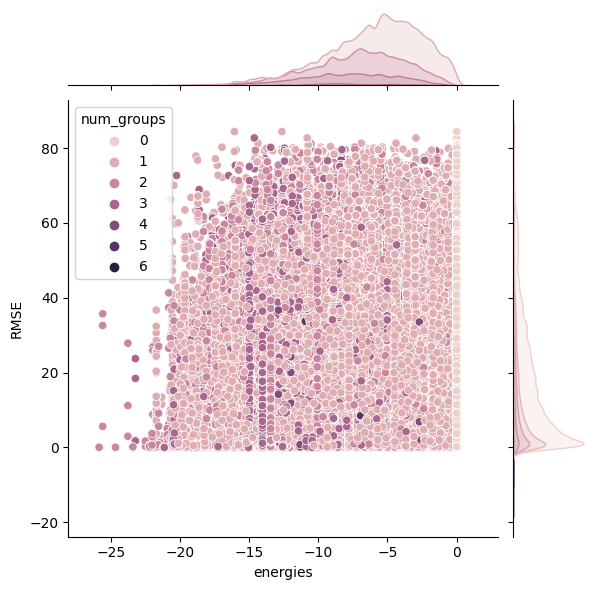

In [34]:
sns.jointplot(infom, x='energies', y='RMSE', hue='num_groups')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


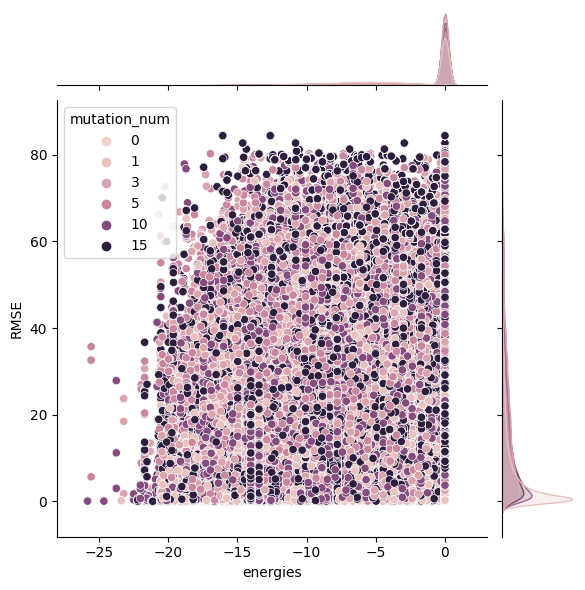

In [16]:
sns.jointplot(infom, x='energies', y='RMSE', hue='mutation_num')

In [17]:
# sns.kdeplot(infom, x='energies', y='RMSE', fill=True, cbar=True)


In [18]:
infom.columns

Index(['circuit_name', 'mutation_name', 'mutation_num', 'mutation_type',
       'mutation_positions', 'path_to_template_circuit', 'name', 'interacting',
       'self_interacting', 'num_interacting', 'num_self_interacting',
       'num_interacting_diff_to_base_circuit',
       'num_self_interacting_diff_to_base_circuit',
       'num_interacting_ratio_from_mutation_to_base',
       'num_self_interacting_ratio_from_mutation_to_base', 'fold_change',
       'final_deriv', 'initial_steady_states', 'max_amount', 'min_amount',
       'overshoot', 'RMSE', 'steady_states', 'response_time_wrt_species-6',
       'response_time_wrt_species-6_diff_to_base_circuit',
       'response_time_wrt_species-6_ratio_from_mutation_to_base',
       'precision_wrt_species-6',
       'precision_wrt_species-6_diff_to_base_circuit',
       'precision_wrt_species-6_ratio_from_mutation_to_base',
       'sensitivity_wrt_species-6',
       'sensitivity_wrt_species-6_diff_to_base_circuit',
       'sensitivity_wrt_specie

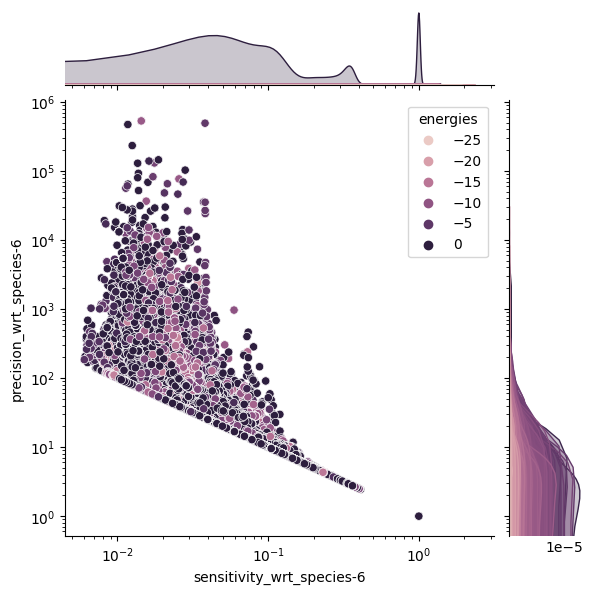

In [19]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
plt.xscale('log')
plt.yscale('log')

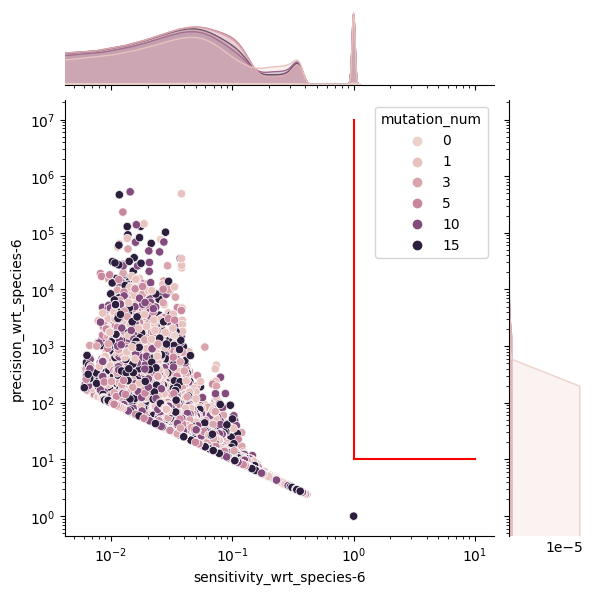

In [20]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

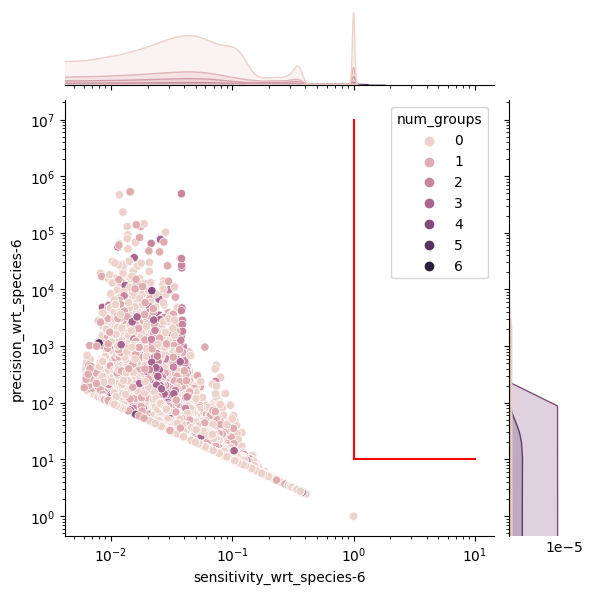

In [52]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='num_groups')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

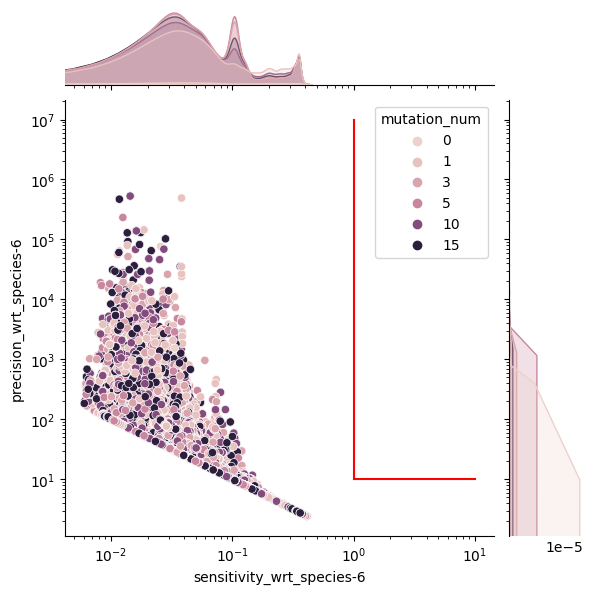

In [21]:
sns.jointplot(infom[infom['sample_name'] != 'RNA_0'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

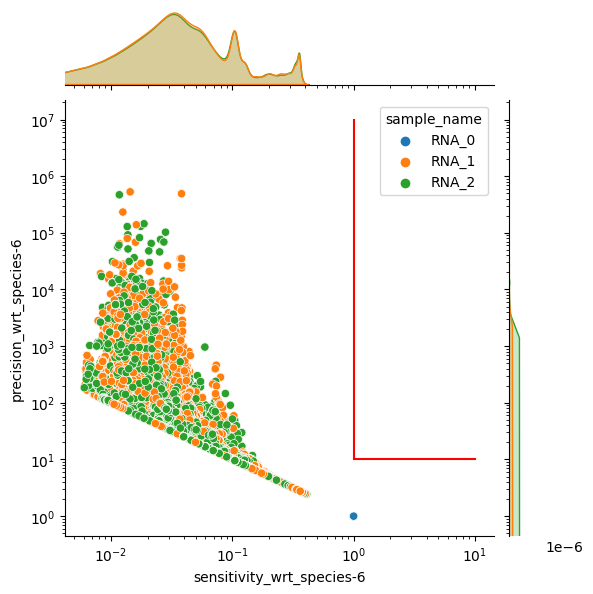

In [22]:
sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='sample_name')
plt.xscale('log')
plt.yscale('log')

plt.plot(np.ones(100), np.linspace(10, 1e7, 100), color='r')
plt.plot(np.linspace(1, 10, 40), np.ones(40) * 10, color='r')

In [23]:
# sns.jointplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
# # sns.kdeplot(infom, x='sensitivity_wrt_species-6', y='precision_wrt_species-6')
# plt.xscale('log')
# plt.yscale('log')

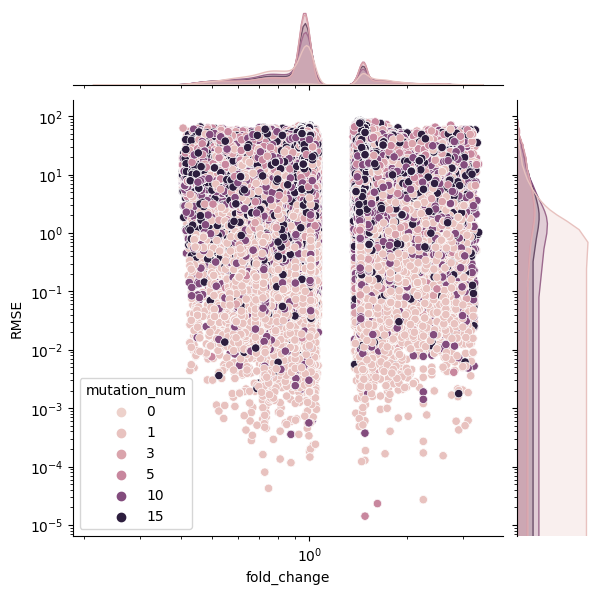

In [24]:
sns.jointplot(infom, x='fold_change', y='RMSE', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


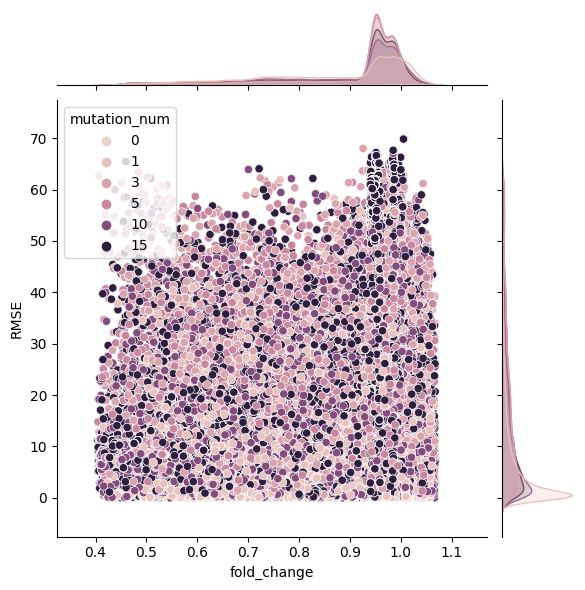

In [25]:
sns.jointplot(infom[infom['sample_name'] != 'RNA_0'], x='fold_change', y='RMSE', hue='mutation_num')
# plt.xscale('log')
# plt.yscale('log')

In [26]:
# sns.jointplot(infom, x='fold_change', y='precision_wrt_species-6', hue='sensitivity_wrt_species-6')
# plt.xscale('log')
# plt.yscale('log')

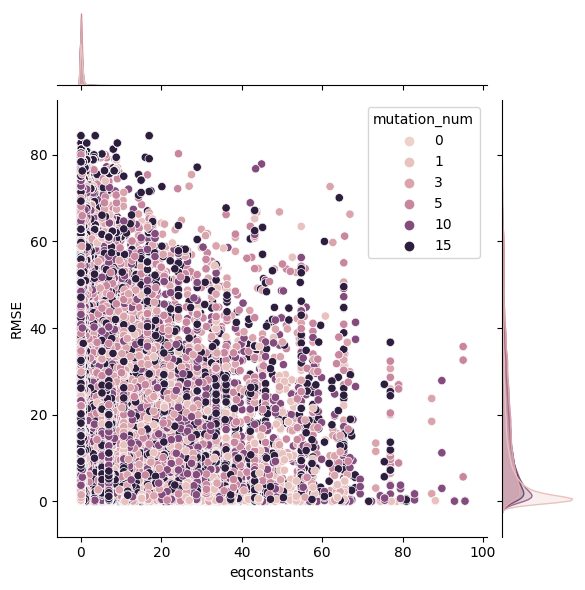

In [27]:
sns.jointplot(infom, x='eqconstants', y='RMSE', hue='mutation_num')

In [28]:
# sns.jointplot(infom, x='binding_rates_dissociation', y='RMSE', hue='mutation_num')

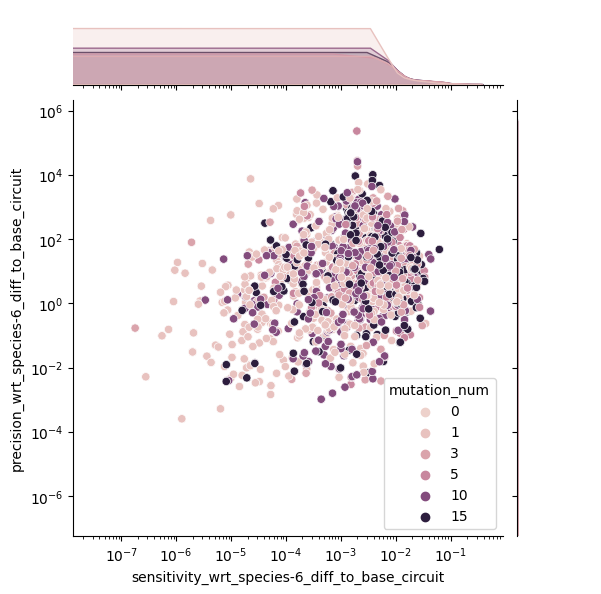

In [48]:
sns.jointplot(infom, x='sensitivity_wrt_species-6_diff_to_base_circuit', y='precision_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

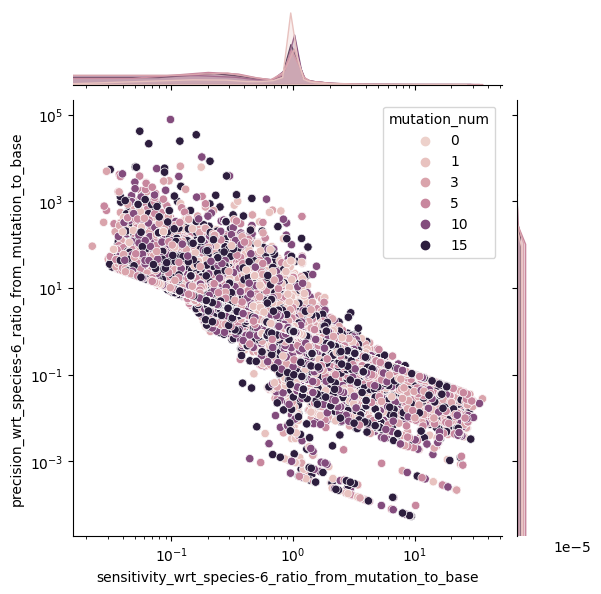

In [30]:
sns.jointplot(infom, x='sensitivity_wrt_species-6_ratio_from_mutation_to_base', y='precision_wrt_species-6_ratio_from_mutation_to_base', hue='mutation_num')
plt.xscale('log')
plt.yscale('log')

In [31]:
# sns.scatterplot(infom[infom['mutation_name'] == 'ref_circuit'], x='sensitivity_wrt_species-6', y='precision_wrt_species-6', hue='energies')
# plt.xscale('log')
# plt.yscale('log')

In [32]:
# sns.jointplot(infom, x='sensitivity_wrt_species-6_diff_to_base_circuit', y='precision_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
# plt.yscale('log')

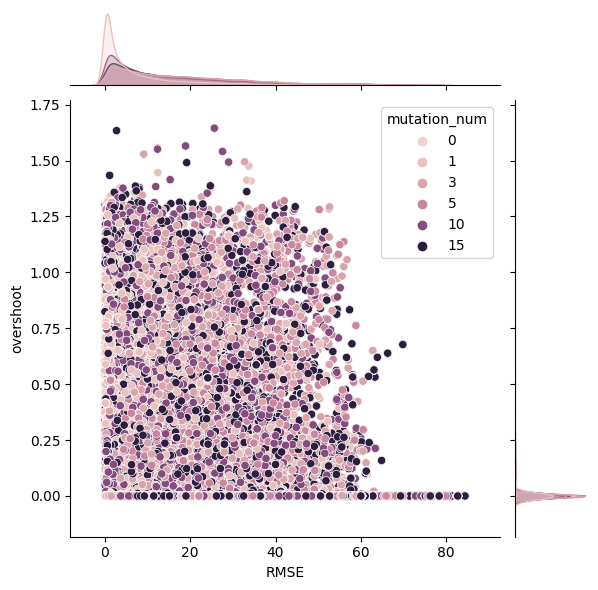

In [33]:
sns.jointplot(infom, x='RMSE', y='overshoot', hue='mutation_num')
# plt.yscale('log')

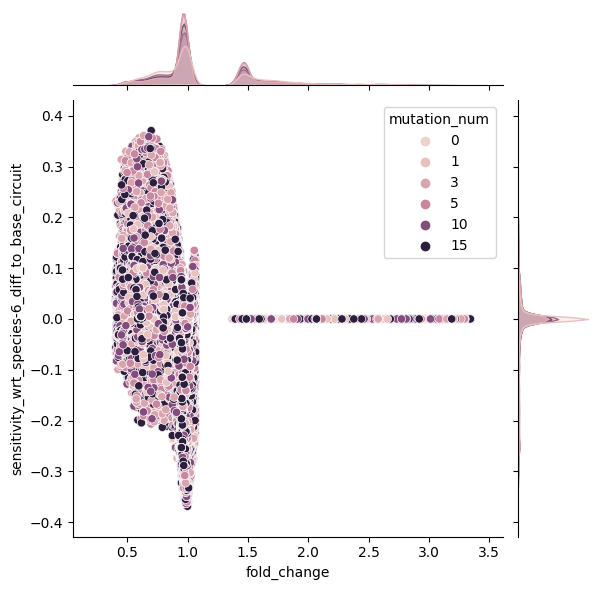

In [34]:
sns.jointplot(infom, x='fold_change', y='sensitivity_wrt_species-6_diff_to_base_circuit', hue='mutation_num')
# sns.kdeplot(infom, x='fold_change', y='sensitivity_wrt_species-6_diff_to_base_circuit') #, fill=True, cbar=True) #, hue='mutation_num')
# plt.yscale('log')

/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/home/wadh6511/Kode/env_circuits/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


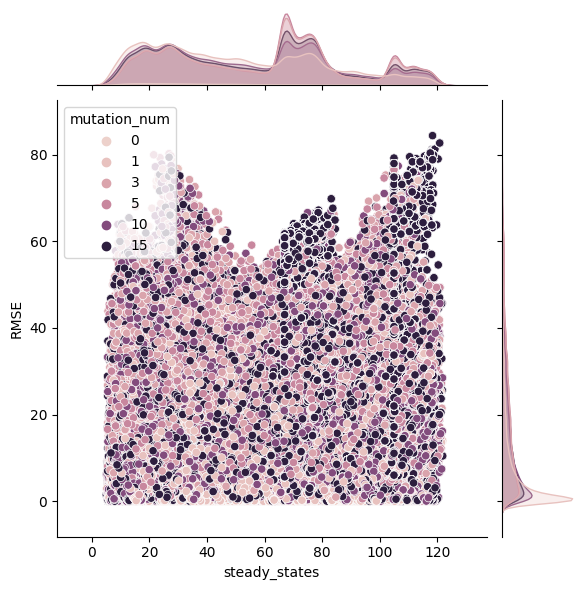

In [35]:
sns.jointplot(infom, x='steady_states', y='RMSE', hue='mutation_num')
# sns.kdeplot(infom, x='steady_states', y='RMSE') #, fill=True, cbar=True) #, hue='mutation_num')

Relevant columns 

In [138]:
relevant_cols = [
    'fold_change', 
    # 'initial_steady_states', 
    # 'max_amount', 'min_amount',
    'overshoot', 
    'RMSE', 
    'steady_states', 
    # 'response_time_wrt_species-6',
    # 'response_time_wrt_species-6_diff_to_base_circuit',
    # 'response_time_wrt_species-6_ratio_from_mutation_to_base',
    'precision_wrt_species-6',
    'precision_wrt_species-6_diff_to_base_circuit',
    'precision_wrt_species-6_ratio_from_mutation_to_base',
    'sensitivity_wrt_species-6',
    'sensitivity_wrt_species-6_diff_to_base_circuit',
    'sensitivity_wrt_species-6_ratio_from_mutation_to_base',
    'fold_change_diff_to_base_circuit',
    # 'initial_steady_states_diff_to_base_circuit',
    # 'max_amount_diff_to_base_circuit', 'min_amount_diff_to_base_circuit',
    'overshoot_diff_to_base_circuit', 
    # 'RMSE_diff_to_base_circuit',
    'steady_states_diff_to_base_circuit',
    'fold_change_ratio_from_mutation_to_base',
    # 'initial_steady_states_ratio_from_mutation_to_base',
    # 'max_amount_ratio_from_mutation_to_base',
    # 'min_amount_ratio_from_mutation_to_base',
    # 'overshoot_ratio_from_mutation_to_base',
    # 'RMSE_ratio_from_mutation_to_base',
    'steady_states_ratio_from_mutation_to_base', 
    # 'num_groups',
    'energies', 
    'binding_rates_dissociation',
    'eqconstants',
    'energies_diffs', 
    'binding_rates_dissociation_diffs',
    'eqconstants_diffs'
    ]

info_summ = infom.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg(
    **{{(c, 'std'): pd.NamedAgg(column=c, aggfunc="std"), (c, 'mean'): pd.NamedAgg(column=c, aggfunc="mean"), (c, 'std_normed_bymean'): pd.NamedAgg(column=c, aggfunc=lambda x: np.std(x) / np.mean(x))} for c in relevant_cols})
    # {c: [np.std, np.mean, lambda x: np.std(x) / np.mean(x)] for c in relevant_cols})


TypeError: unhashable type: 'dict'

In [133]:
for c in relevant_cols:
    info_summ.loc[c].rename({'<lambda_0>': 'std_normed_bymean'}, inplace=True)

KeyError: 'fold_change'

In [132]:
info_summ

circuit_name mutation_num sample_name fold_change            \
                                                               std      mean   
0      toy_mRNA_circuit_10000            0       RNA_0    0.000000  1.736741   
1      toy_mRNA_circuit_10000            0       RNA_1    0.000000  1.016215   
2      toy_mRNA_circuit_10000            0       RNA_2    0.000000  0.739559   
3      toy_mRNA_circuit_10000            1       RNA_0    0.161323  1.650666   
4      toy_mRNA_circuit_10000            1       RNA_1    0.026252  0.994271   
...                       ...          ...         ...         ...       ...   
17995  toy_mRNA_circuit_36038           10       RNA_1    0.152300  0.781428   
17996  toy_mRNA_circuit_36038           10       RNA_2    0.066798  0.960738   
17997  toy_mRNA_circuit_36038           15       RNA_0    0.266467  1.668990   
17998  toy_mRNA_circuit_36038           15       RNA_1    0.156830  0.847324   
17999  toy_mRNA_circuit_36038           15       RNA_2    0.058949  0.954849   

                 overshoot                            RMSE  ... eqconstants  \
      <lambda_0>       std      mean <lambda_0>        std  ...  <lambda_0>   
0       0.000000  0.000000  0.000000        NaN   0.000000  ...    1.097722   
1       0.000000  0.000000  0.765835   0.000000   0.000000  ...    1.097722   
2       0.000000  0.000000  0.000000        NaN   0.000000  ...    1.097722   
3       0.097505  0.000000  0.000000        NaN  11.123427  ...    4.172264   
4       0.026342  0.374535  0.432944   0.863084   8.190599  ...    4.172264   
...          ...       ...       ...        ...        ...  ...         ...   
17995   0.194448  0.183307  0.038134   4.795832  20.836476  ...    2.722523   
17996   0.069367  0.366079  0.245112   1.490059  11.415295  ...    2.722523   
17997   0.159288  0.000000  0.000000        NaN   8.132069  ...    6.118075   
17998   0.184659  0.169547  0.035271   4.795832  16.910828  ...    6.118075   
17999   0.061594  0.302196  0.113017   2.667691   8.584000  ...    6.118075   

      energies_diffs                      binding_rates_dissociation_diffs  \
                 std      mean <lambda_0>                              std   
0           0.000000  0.000000        NaN                         0.000000   
1           0.000000  0.000000        NaN                         0.000000   
2           0.000000  0.000000        NaN                         0.000000   
3           2.117065  0.551574   3.829329                         0.129963   
4           2.117065  0.551574   3.829329                         0.129963   
...              ...       ...        ...                              ...   
17995       2.596163  0.972130   2.664405                         0.184559   
17996       2.596163  0.972130   2.664405                         0.184559   
17997       2.959799  1.162500   2.540163                         0.190706   
17998       2.959799  1.162500   2.540163                         0.190706   
17999       2.959799  1.162500   2.540163                         0.190706   

                           eqconstants_diffs                        
           mean <lambda_0>               std      mean  <lambda_0>  
0      0.000000        NaN          0.000000  0.000000         NaN  
1      0.000000        NaN          0.000000  0.000000         NaN  
2      0.000000        NaN          0.000000  0.000000         NaN  
3      0.039651   3.270112          0.299888  0.006847   43.697234  
4      0.039651   3.270112          0.299888  0.006847   43.697234  
...         ...        ...               ...       ...         ...  
17995  0.082297   2.237396          0.140235 -0.000304 -460.098923  
17996  0.082297   2.237396          0.140235 -0.000304 -460.098923  
17997  0.100412   1.894829          0.715568  0.059747   11.948789  
17998  0.100412   1.894829          0.715568  0.059747   11.948789  
17999  0.100412   1.894829          0.715568  0.059747   11.948789  

[18000 rows x 66 columns]

<AxesSubplot: xlabel='RMSE', ylabel='Count'>

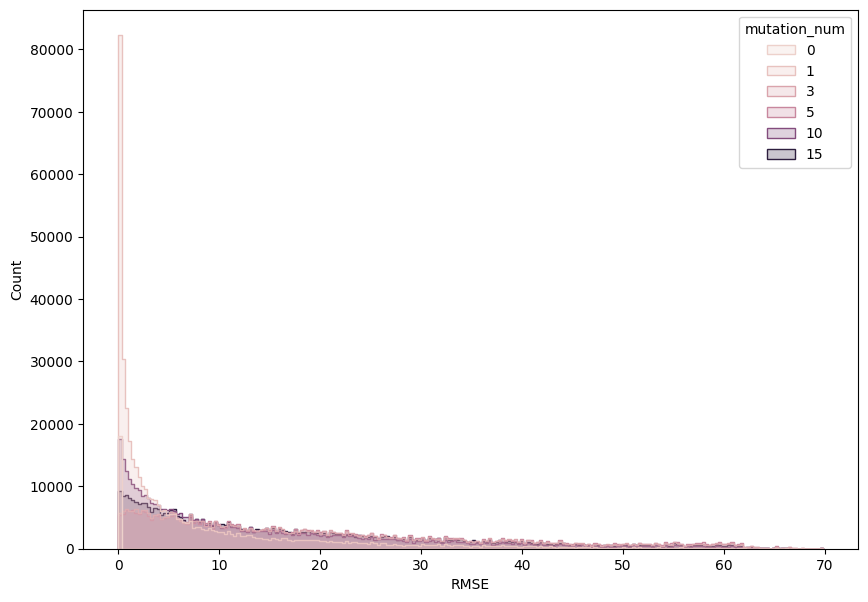

In [30]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='RMSE', hue='mutation_num', element='step')


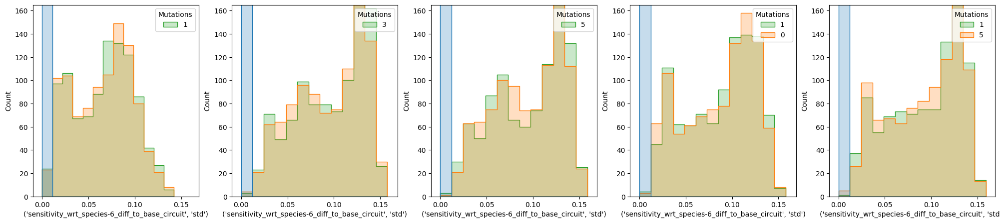

In [34]:
plt.figure(figsize=(5*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(info_summ[info_summ['mutation_num'] == m], x=('sensitivity_wrt_species-6_diff_to_base_circuit', 'std'), element='step', hue='sample_name')
        plt.legend(str(m), title='Mutations')
        plt.xlim([info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].min() - 0.01, info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].max() + 0.01])
        plt.ylim([0,165])


<AxesSubplot: xlabel="('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')", ylabel='Count'>

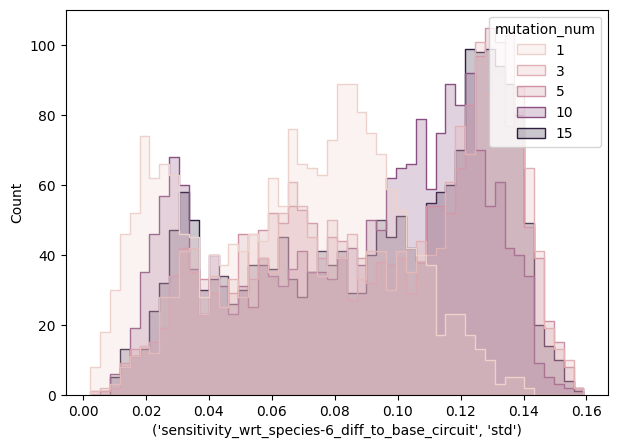

In [40]:
plt.figure(figsize=(7,5))
# ax = plt.subplot(1,2,1)
sns.histplot(info_summ[(info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')] > 0) & (info_summ['sample_name'] != 'RNA_0')], x=('sensitivity_wrt_species-6_diff_to_base_circuit', 'std'), hue='mutation_num', element="step", bins=50)


<AxesSubplot: xlabel="('precision_wrt_species-6_diff_to_base_circuit', 'std')", ylabel='Count'>

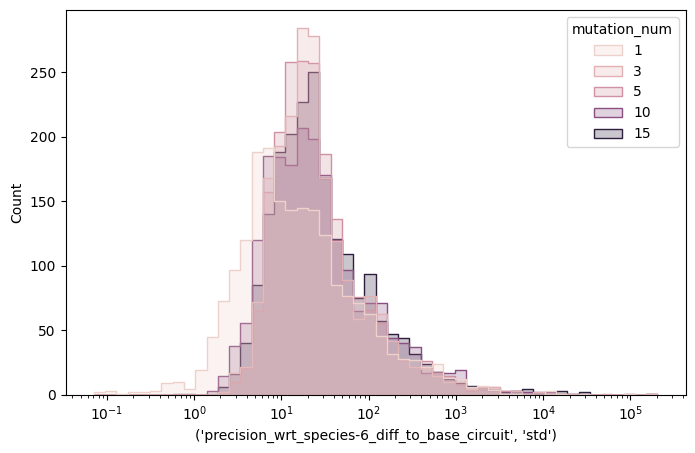

In [42]:
plt.figure(figsize=(8,5))
sns.histplot(info_summ[(info_summ['mutation_num'] != 0) & (info_summ['sample_name'] != 'RNA_0')], x=('precision_wrt_species-6_diff_to_base_circuit', 'std'), hue='mutation_num', element="step", bins=50, log_scale=[True, False])


Mutational stability?

In [43]:
info_summ[('precision_times_sensitivity', 'std')] = info_summ[('precision_wrt_species-6', 'std')] * info_summ[('sensitivity_wrt_species-6', 'std')]
info_summ[('precision_times_sensitivity', 'mean')] = info_summ[('precision_wrt_species-6', 'mean')] * info_summ[('sensitivity_wrt_species-6', 'mean')]


<AxesSubplot: xlabel="('precision_times_sensitivity', 'mean')", ylabel='Count'>

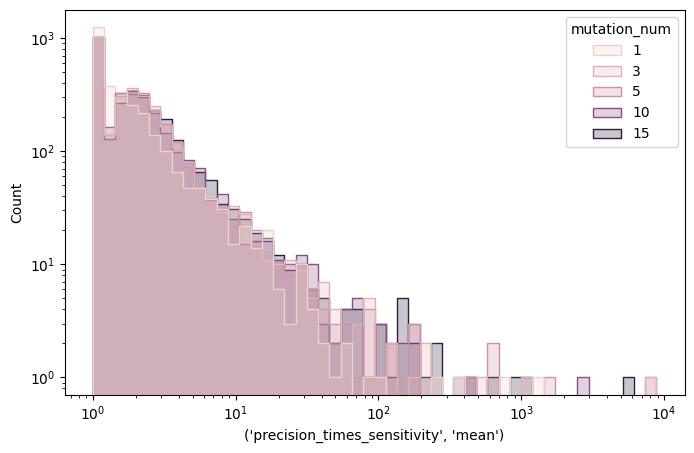

In [45]:
plt.figure(figsize=(8,5))
sns.histplot(info_summ[info_summ['mutation_num'] != 0], x=('precision_times_sensitivity', 'mean'), hue='mutation_num', element="step", bins=50, log_scale=[True, True])
# sns.histplot(info_summ, x=('precision_times_sensitivity', 'mean'), hue='mutation_num', element="step", bins=50, log_scale=[True, False])


In [47]:
stds = info_summ.groupby(['mutation_num'], as_index=False).agg({(c, 'std'): 'std' for c in relevant_cols + ['precision_times_sensitivity']})
means = info_summ.groupby(['mutation_num'], as_index=False).agg({(c, 'mean'): 'mean' for c in relevant_cols + ['precision_times_sensitivity']})
for c in means.columns:
    stds[c] = means[c]

stds

,mutation_num,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,...,sensitivity_wrt_species-6_ratio_from_mutation_to_base,fold_change_diff_to_base_circuit,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants,precision_times_sensitivity
,,std,std,std,std,std,std,std,std,std,...,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-3.394831,0.243098,0.536169,2.390404
1,1,0.095157,0.118954,4.173747,4.974503,1933.638670,1933.638687,81.911691,0.040407,0.040407,...,1.058830,-0.004662,-0.020711,3.159770,1.010588,1.158702,-2.978351,0.270691,0.484679,3.257153
2,3,0.126214,0.095242,5.950004,5.301111,3529.779104,3529.779274,279.760986,0.054151,0.054151,...,1.134953,-0.020915,-0.062929,11.868998,1.034071,1.593024,-1.902243,0.337734,0.333660,6.914297
3,5,0.127084,0.089937,6.231913,5.508043,3863.854084,3863.854256,302.759039,0.053944,0.053944,...,1.134383,-0.021848,-0.065320,12.545535,1.035025,1.624146,-1.825599,0.342427,0.318436,7.100953
4,10,0.120520,0.122904,4.682410,4.920118,2085.333949,2085.333943,287.351369,0.051053,0.051053,...,1.094886,-0.011182,-0.043236,7.123705,1.022219,1.359537,-2.465000,0.303398,0.419023,4.661109
5,15,0.124296,0.111035,5.291123,5.065053,3029.011334,3029.011463,298.765146,0.053775,0.053775,...,1.114103,-0.015972,-0.053556,9.429735,1.028464,1.473544,-2.183762,0.320698,0.377759,6.694849


In [48]:
std_m = stds.melt(id_vars=[('mutation_num', '')], value_vars=[(sc[0], 'std') for sc in stds.columns if sc[0] != 'mutation_num'], value_name='analytic_value', var_name='analytic').rename(columns={('mutation_num', ''): 'mutation_num'})
std_m2 = std_m.groupby(['analytic']).apply(lambda x: x / x.max())
std_m2['analytic'] = std_m['analytic']


/tmp/ipykernel_840873/1873039219.py:2: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  std_m2 = std_m.groupby(['analytic']).apply(lambda x: x / x.max())


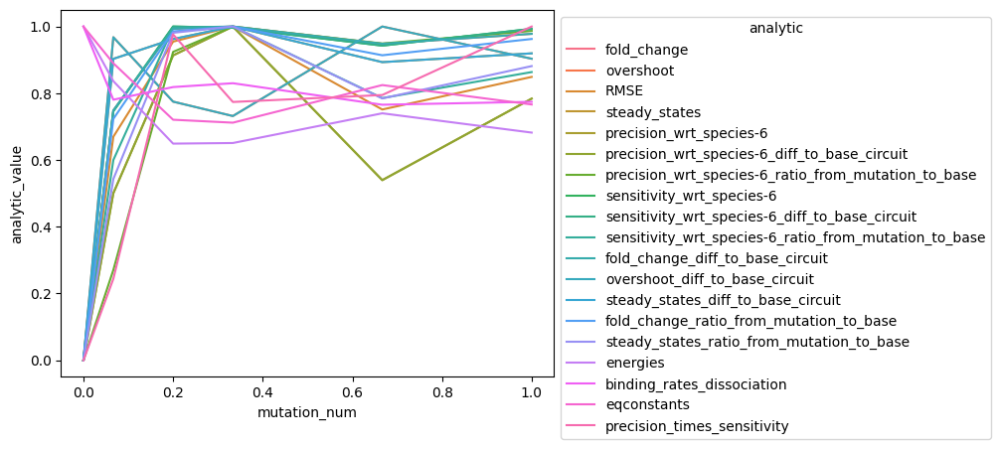

In [49]:
# sns.lineplot(stds, x='mutation_num', y=('precision_times_sensitivity', 'std'))
ax = sns.lineplot(std_m2, 
             x='mutation_num', y='analytic_value', hue='analytic')
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))

<AxesSubplot: xlabel="('mutation_num', '')", ylabel="('fold_change', 'std_normed_by_mean')">

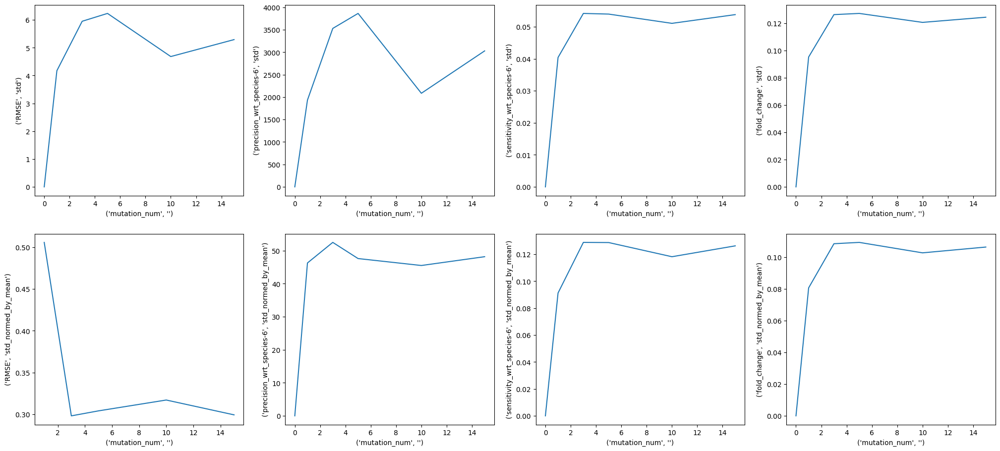

In [50]:
std_cols = ['RMSE',
            'precision_wrt_species-6',
            'sensitivity_wrt_species-6',
            'fold_change']
for sc in std_cols:
    stds[(sc, 'std_normed_by_mean')] = stds[(sc, 'std')] / stds[(sc, 'mean')]

plt.figure(figsize=(25, 11))
ax = plt.subplot(2, 4, 1)
sns.lineplot(stds, x=('mutation_num', ''), y=('RMSE', 'std'))
ax = plt.subplot(2, 4, 2)
sns.lineplot(stds, x=('mutation_num', ''), y=(
    'precision_wrt_species-6', 'std'))
ax = plt.subplot(2, 4, 3)
sns.lineplot(stds, x=('mutation_num', ''), y=(
    'sensitivity_wrt_species-6', 'std'))
ax = plt.subplot(2, 4, 4)
sns.lineplot(stds, x=('mutation_num', ''), y=('fold_change', 'std'))

ax = plt.subplot(2, 4, 5)
sns.lineplot(stds, x=('mutation_num', ''), y=('RMSE', 'std_normed_by_mean'))
ax = plt.subplot(2, 4, 6)
sns.lineplot(stds, x=('mutation_num', ''), y=(
    'precision_wrt_species-6', 'std_normed_by_mean'))
ax = plt.subplot(2, 4, 7)
sns.lineplot(stds, x=('mutation_num', ''), y=(
    'sensitivity_wrt_species-6', 'std_normed_by_mean'))
ax = plt.subplot(2, 4, 8)
sns.lineplot(stds, x=('mutation_num', ''), y=('fold_change', 'std_normed_by_mean'))


In [67]:
info_summ['precision_times_sensitivity']

,std,mean
0,8.524117,7.625858
1,29.324269,10.079686
2,8.336450,5.722051
3,7.553016,4.906790
4,7.205234,5.373480
...,...,...
5995,46.226831,14.289890
5996,3.629719,3.818976
5997,8.676155,5.022808
5998,51.856584,13.395987


<Figure size 800x500 with 0 Axes>

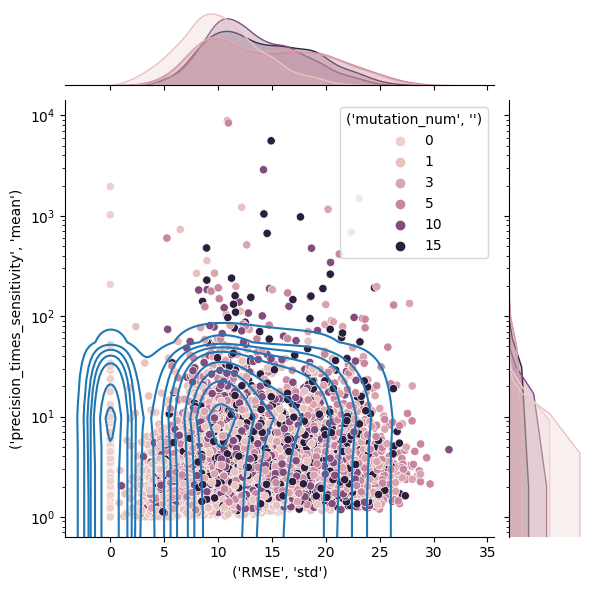

In [52]:
plt.figure(figsize=(8,5))
sns.jointplot(info_summ[info_summ['sample_name'] != 'RNA_0'], x=('RMSE', 'std'), y=('precision_times_sensitivity', 'mean'), hue=('mutation_num', ''))
sns.kdeplot(info_summ[info_summ['sample_name'] != 'RNA_0'], x=('RMSE', 'std'), y=('precision_times_sensitivity', 'mean'))
plt.yscale('log')

In [50]:
info_summ

circuit_name mutation_num fold_change           overshoot  \
                                                  std      mean       std   
0     toy_mRNA_circuit_10000            0    0.428333  1.164172  0.367895   
1     toy_mRNA_circuit_10000            1    0.377645  1.152835  0.297207   
2     toy_mRNA_circuit_10000            3    0.383311  1.152512  0.155681   
3     toy_mRNA_circuit_10000            5    0.459893  1.166357  0.150044   
4     toy_mRNA_circuit_10000           10    0.424234  1.161613  0.185929   
...                      ...          ...         ...       ...       ...   
5995  toy_mRNA_circuit_36038            1    0.462207  1.171696  0.312281   
5996  toy_mRNA_circuit_36038            3    0.410241  1.156953  0.030626   
5997  toy_mRNA_circuit_36038            5    0.417516  1.159212  0.122295   
5998  toy_mRNA_circuit_36038           10    0.462854  1.170688  0.259450   
5999  toy_mRNA_circuit_36038           15    0.407547  1.157054  0.205260   

                     RMSE            steady_states             ...  \
          mean        std       mean           std       mean  ...   
0     0.255278   0.000000   0.000000     30.339016  53.327038  ...   
1     0.144315  10.365881  10.194462     31.710983  57.696309  ...   
2     0.032530  12.529568  19.613232     30.712180  61.612502  ...   
3     0.039812  14.200519  19.472030     31.631768  58.351200  ...   
4     0.053373  11.909070  16.280480     30.462616  60.862642  ...   
...        ...        ...        ...           ...        ...  ...   
5995  0.159830   9.947531   7.894306     29.015532  57.170495  ...   
5996  0.003632  12.319232  19.786451     28.235472  66.180612  ...   
5997  0.024048  13.236415  19.050243     28.862072  64.309342  ...   
5998  0.094415  15.372466  15.576515     27.734373  62.464805  ...   
5999  0.049429  12.924577  20.462879     29.218445  65.128558  ...   

     binding_rates_dissociation           eqconstants            \
                            std      mean         std      mean   
0                      0.216888  0.262332    0.072353  0.064679   
1                      0.203100  0.301982    0.298658  0.071526   
2                      0.175643  0.357084    0.450168  0.079427   
3                      0.192411  0.330071    1.151319  0.223933   
4                      0.185574  0.340016    0.180967  0.049803   
...                         ...       ...         ...       ...   
5995                   0.201814  0.304258    0.078904  0.052689   
5996                   0.159667  0.378989    0.048992  0.026052   
5997                   0.167851  0.369188    0.097790  0.039218   
5998                   0.180523  0.348539    0.154822  0.056823   
5999                   0.170404  0.366655    0.715601  0.116875   

     precision_times_sensitivity               RMSEstd  \
                             std       mean              
0                       8.524117   7.625858   0.000000   
1                      29.324269  10.079686  10.365881   
2                       8.336450   5.722051  12.529568   
3                       7.553016   4.906790  14.200519   
4                       7.205234   5.373480  11.909070   
...                          ...        ...        ...   
5995                   46.226831  14.289890   9.947531   
5996                    3.629719   3.818976  12.319232   
5997                    8.676155   5.022808  13.236415   
5998                   51.856584  13.395987  15.372466   
5999                   12.534341   5.464920  12.924577   

     precision_wrt_species-6mean sensitivity_wrt_species-6mean robust  
                                                                       
0                      16.421582                      0.464380  False  
1                      23.091388                      0.436513  False  
2                      13.886572                      0.412056  False  
3                      11.393824                      0.430653  False  
4                      12.530543            

In [53]:
import plotly.express as px
info_summ['RMSE' + 'std'] = info_summ[('RMSE', 'std')]
info_summ['precision_wrt_species-6' + 'mean'] = info_summ[('precision_wrt_species-6', 'mean')]
info_summ['sensitivity_wrt_species-6' + 'mean'] = info_summ[('sensitivity_wrt_species-6', 'mean')]
info_summ['robust'] = (info_summ['sensitivity_wrt_species-6' + 'mean'] > 0.9) & (info_summ['precision_wrt_species-6' + 'mean'] > 5)
fig = px.scatter_3d(
    info_summ[info_summ['mutation_num'] != 0],
    x='sensitivity_wrt_species-6' + 'mean', y='precision_wrt_species-6' + 'mean', z='RMSE' + 'std', 
    color='mutation_num', symbol='robust', log_y=True, log_z=True)
fig.show()


## Examine correlations

In [54]:
infom[relevant_cols + ['mutation_num']].corr()

,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,sensitivity_wrt_species-6_ratio_from_mutation_to_base,fold_change_diff_to_base_circuit,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants,mutation_num
fold_change,1.000000,-0.085180,0.035094,0.437583,-0.006600,0.001430,-0.005939,0.777740,0.052235,-0.091368,-0.049836,0.105374,0.006875,-0.030603,-0.068918,-0.019606,-0.011254,0.009681,-0.002054
overshoot,-0.085180,1.000000,-0.079657,-0.033036,0.043187,0.026450,0.034062,-0.236263,-0.051047,-0.051947,0.058668,0.265759,-0.032276,0.042493,-0.023394,-0.097171,-0.083966,0.038613,-0.027617
RMSE,0.035094,-0.079657,1.000000,0.367492,-0.004927,-0.001286,-0.000019,-0.002587,-0.286901,-0.060528,-0.091075,-0.043450,0.596126,0.159236,0.658549,0.123366,0.138374,-0.033757,0.086605
steady_states,0.437583,-0.033036,0.367492,1.000000,0.000100,0.008880,-0.001767,0.443118,-0.063905,-0.073212,-0.173367,0.011767,0.470834,-0.035709,0.219682,0.156869,0.149422,-0.051074,0.021391
precision_wrt_species-6,-0.006600,0.043187,-0.004927,0.000100,1.000000,0.906450,0.864118,-0.017494,-0.009411,-0.010525,0.004905,0.022648,-0.000718,0.004014,-0.001939,-0.003601,-0.002645,0.001647,0.000209
precision_wrt_species-6_diff_to_base_circuit,0.001430,0.026450,-0.001286,0.008880,0.906450,1.000000,0.798506,-0.000914,-0.018747,-0.029853,0.005758,0.046121,0.001161,0.008622,-0.000536,-0.001380,0.000173,0.001935,0.000193
precision_wrt_species-6_ratio_from_mutation_to_base,-0.005939,0.034062,-0.000019,-0.001767,0.864118,0.798506,1.000000,-0.016337,-0.025450,-0.014590,0.010574,0.029113,0.003999,0.014175,0.005259,-0.003455,-0.002017,0.001963,0.002566
sensitivity_wrt_species-6,0.777740,-0.236263,-0.002587,0.443118,-0.017494,-0.000914,-0.016337,1.000000,0.280521,-0.014414,-0.315285,0.179549,-0.038517,-0.306752,-0.157384,-0.014744,-0.015803,0.002587,-0.004842
sensitivity_wrt_species-6_diff_to_base_circuit,0.052235,-0.051047,-0.286901,-0.063905,-0.009411,-0.018747,-0.025450,0.280521,1.000000,0.583032,-0.402122,-0.205124,-0.454075,-0.656999,-0.547731,-0.057167,-0.070924,0.008006,-0.021173
sensitivity_wrt_species-6_ratio_from_mutation_to_base,-0.091368,-0.051947,-0.060528,-0.073212,-0.010525,-0.029853,-0.014590,-0.014414,0.583032,1.000000,-0.184365,-0.255692,-0.263553,-0.306696,-0.226782,0.001390,-0.012396,-0.007952,0.005783


In [53]:
infom[infom['sample_name'] != 'RNA_0'][relevant_cols + ['mutation_num']].corr()['mutation_num'].sort_values()

overshoot                                               -0.034391
sensitivity_wrt_species-6_diff_to_base_circuit          -0.026342
sensitivity_wrt_species-6                               -0.025599
overshoot_diff_to_base_circuit                          -0.024503
eqconstants                                             -0.004007
precision_wrt_species-6_diff_to_base_circuit             0.000236
precision_wrt_species-6                                  0.000255
precision_wrt_species-6_ratio_from_mutation_to_base      0.003143
sensitivity_wrt_species-6_ratio_from_mutation_to_base    0.007097
fold_change                                              0.018699
fold_change_diff_to_base_circuit                         0.019676
fold_change_ratio_from_mutation_to_base                  0.023122
energies                                                 0.023789
steady_states                                            0.027089
steady_states_diff_to_base_circuit                       0.029868
binding_ra

<AxesSubplot: xlabel='sensitivity_wrt_species-6_diff_to_base_circuit', ylabel='Count'>

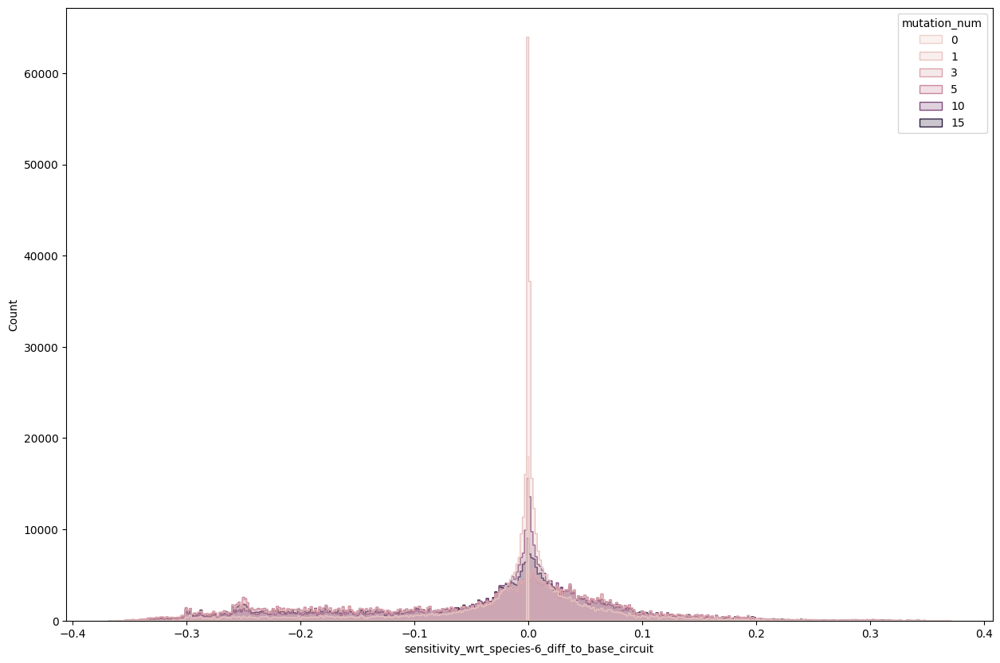

In [54]:
plt.figure(figsize=(15,10))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='sensitivity_wrt_species-6_diff_to_base_circuit', hue='mutation_num', element='step')


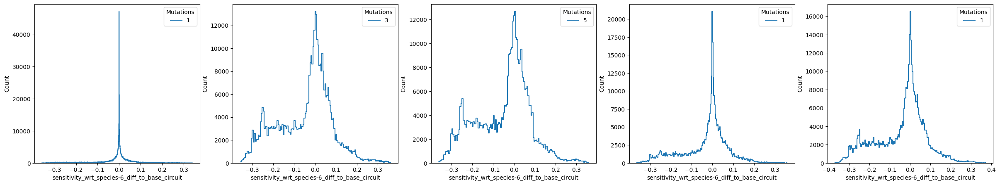

In [55]:
plt.figure(figsize=(6*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(infom[(infom['sample_name'] != 'RNA_0') & (infom['mutation_num'] == m)], x='sensitivity_wrt_species-6_diff_to_base_circuit', stat='count', element='step', fill=False)
        plt.legend(str(m), title='Mutations')
        # plt.xlim([info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].min() - 0.01, info_summ[('sensitivity_wrt_species-6_diff_to_base_circuit', 'std')].max() + 0.01])
        # plt.ylim([0,165])


## Energies

<AxesSubplot: xlabel='binding_rates_dissociation', ylabel='Count'>

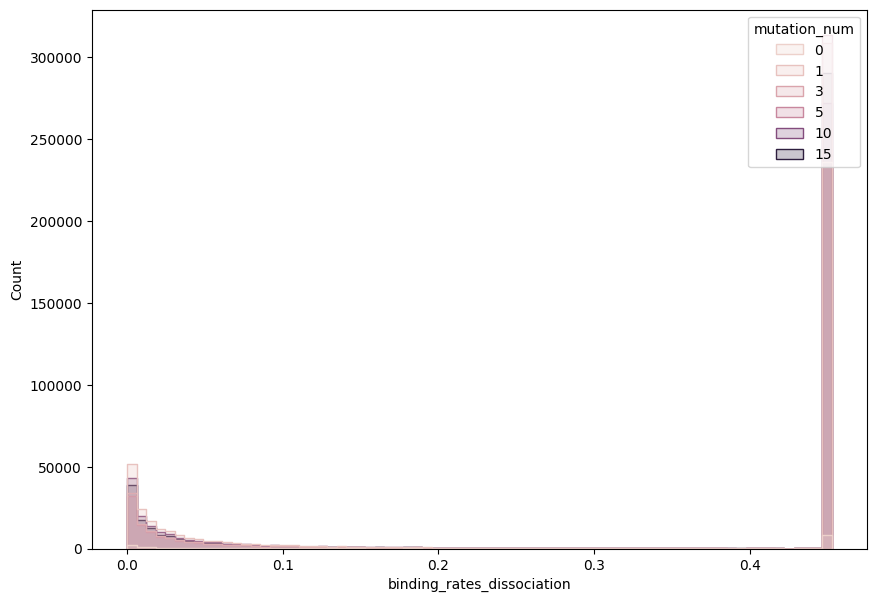

In [56]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='binding_rates_dissociation', hue='mutation_num', element='step')


<AxesSubplot: xlabel="('binding_rates_dissociation', 'std')", ylabel='Count'>

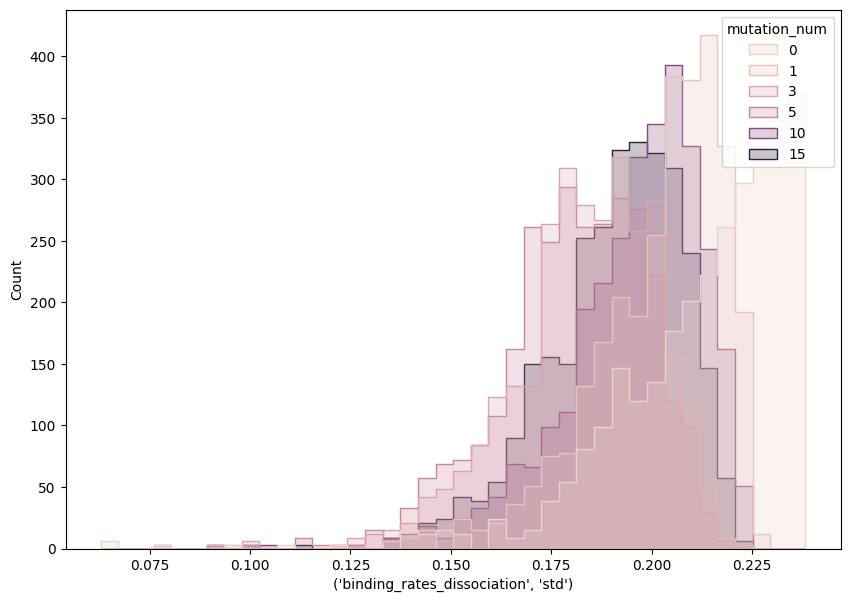

In [76]:
plt.figure(figsize=(10,7))
sns.histplot(info_summ, x=('binding_rates_dissociation', 'std'), hue='mutation_num', element='step', bins=40)


<AxesSubplot: xlabel='eqconstants', ylabel='Count'>

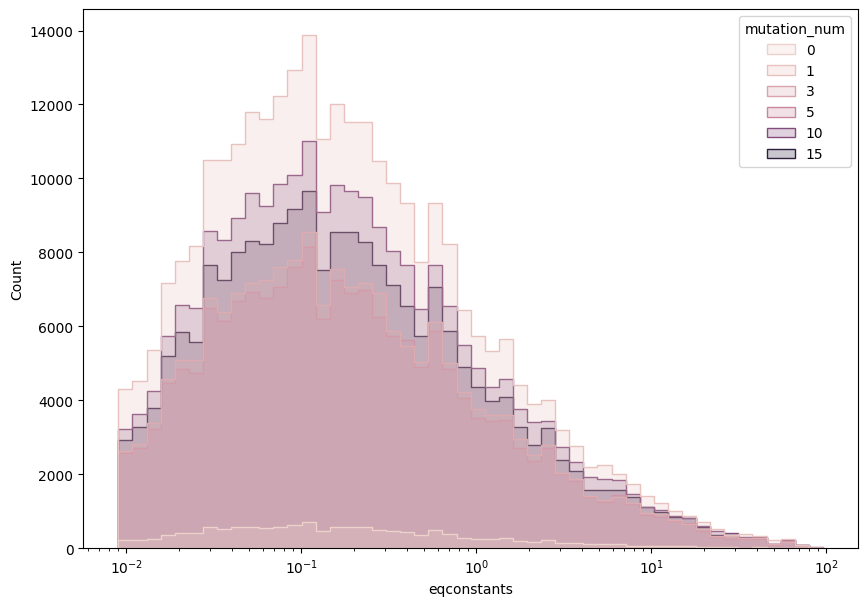

In [57]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['eqconstants'] > 0.009], x='eqconstants', hue = 'mutation_num', multiple='layer', element='step', stat='count', log_scale=[True, False], bins=50)
# plt.xscale('log')


<AxesSubplot: xlabel='eqconstants', ylabel='Count'>

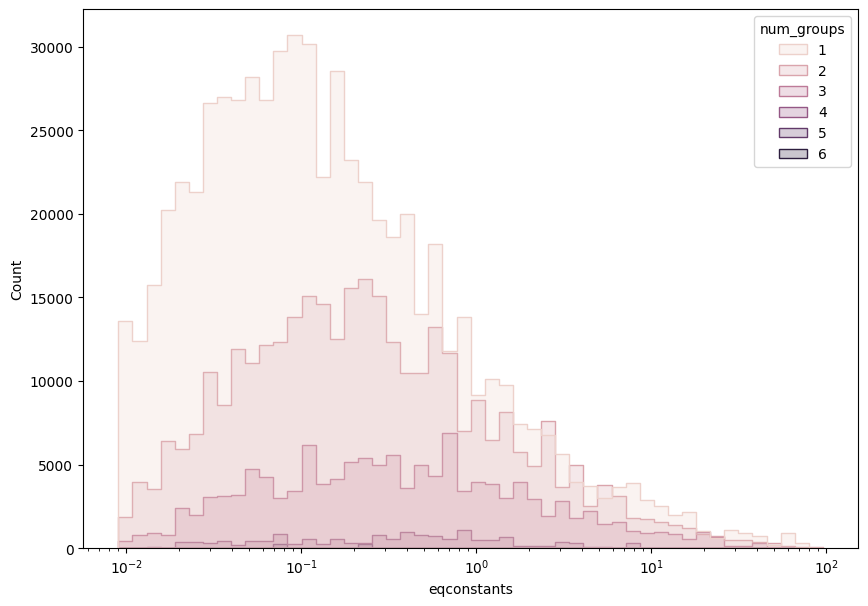

In [15]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['eqconstants'] > 0.009], x='eqconstants', hue = 'num_groups', multiple='layer', element='step', stat='count', log_scale=[True, False], bins=50)


<Figure size 1000x700 with 0 Axes>

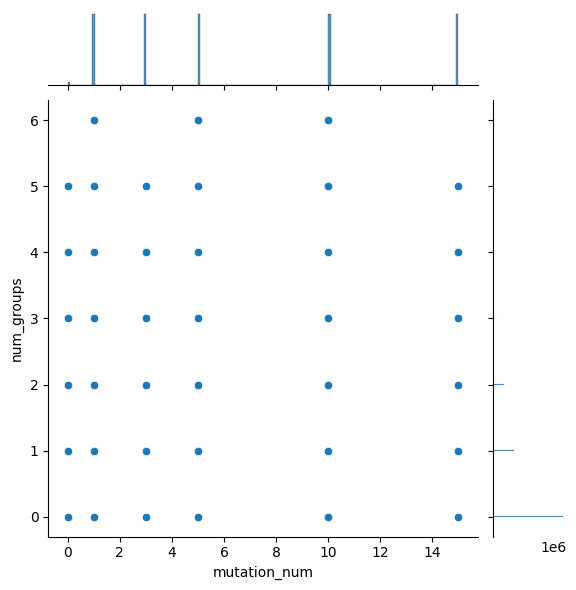

In [17]:
plt.figure(figsize=(10,7))
sns.jointplot(infom, x='mutation_num', y = 'num_groups')


In [58]:
infom['eqconstants'].mode()

0    0.00667
Name: eqconstants, dtype: float64

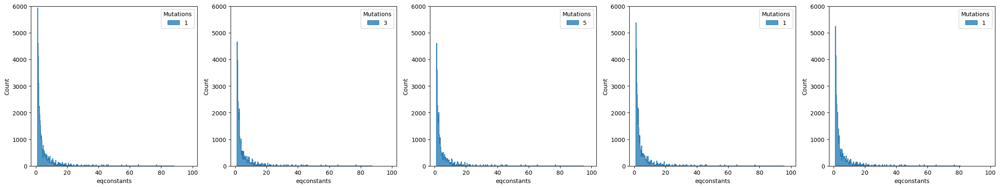

In [59]:
plt.figure(figsize=(6*len(info_summ['mutation_num'].unique()), 5))
for i, m in enumerate(info_summ['mutation_num'].unique()):
    if m != 0:
        ax = plt.subplot(1, len(info_summ['mutation_num'].unique()), i)
        sns.histplot(infom[(infom['eqconstants'] >= 1) & (infom['mutation_num'] == m)], x='eqconstants', stat='count', element='step', fill=True)
        plt.legend(str(m), title='Mutations')
        plt.xlim([-3, 103])
        plt.ylim([0,6000])


<AxesSubplot: xlabel='energies', ylabel='Count'>

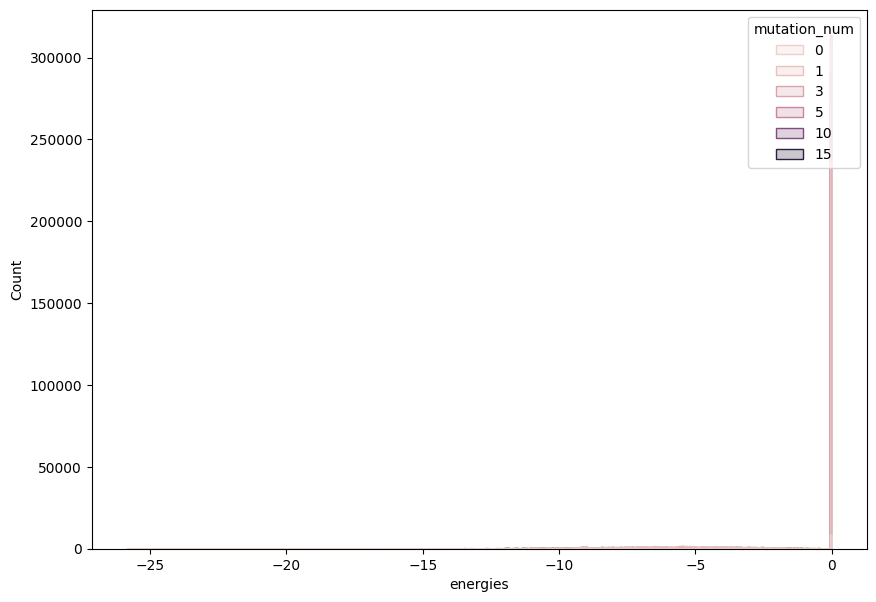

In [60]:
plt.figure(figsize=(10,7))
sns.histplot(infom[infom['sample_name'] != 'RNA_0'], x='energies', hue='mutation_num', element='step')


In [61]:
len(relevant_cols)

18

core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593: Too few points to create valid contours WARNING
core.py:hist2d():593

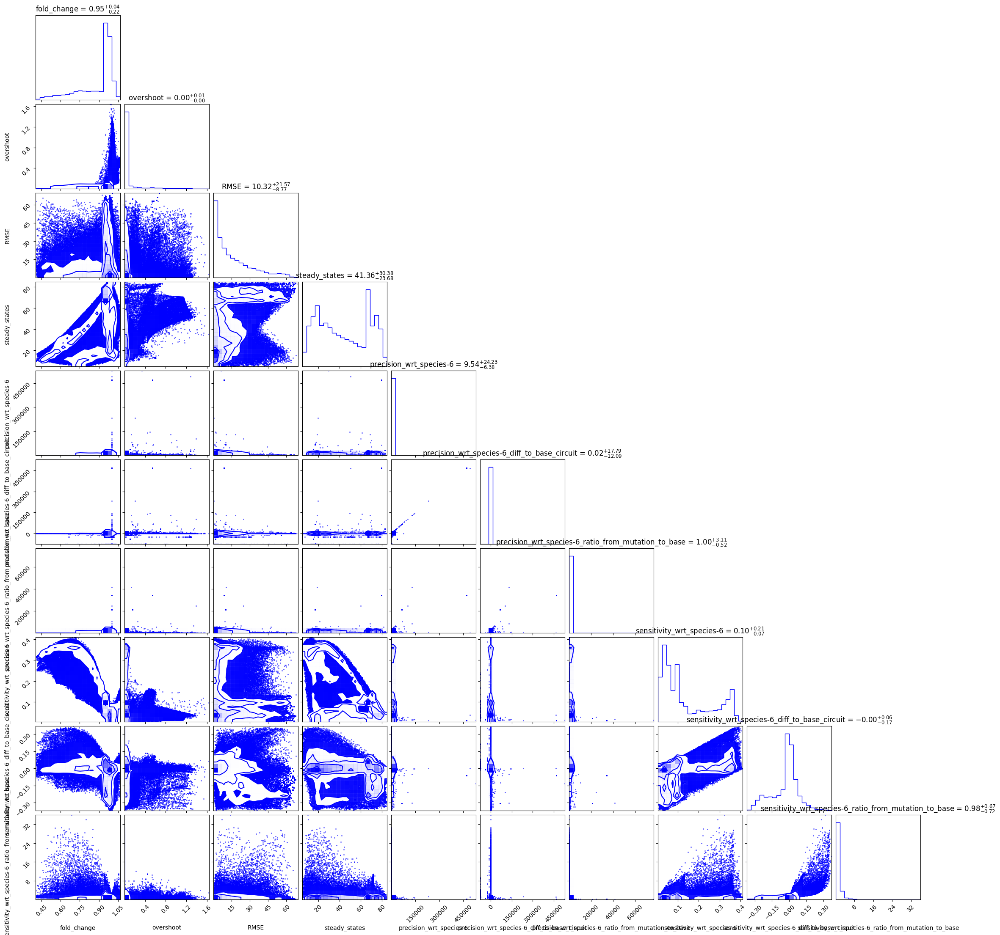

In [62]:
cols = relevant_cols[0:10]
temp = infom[(infom['sample_name'] != 'RNA_0') & (infom['precision_wrt_species-6'] != np.inf) & (infom['precision_wrt_species-6_diff_to_base_circuit'] != -np.inf)][cols]
# for c in cols:
#     if 'precision' in c:
#         temp[c] = np.log(temp[c])
fig = corner.corner(temp, labels=cols, show_titles=True, title_kwargs={"fontsize": 12}, color='b')

In [63]:
infom[relevant_cols][(infom[relevant_cols] < np.inf) & (infom[relevant_cols] != np.nan) & (np.isnan(infom[relevant_cols]) == False)]

,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,sensitivity_wrt_species-6_ratio_from_mutation_to_base,fold_change_diff_to_base_circuit,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants
0,1.736741,0.000000,0.000000,86.041120,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667
1,1.016215,0.765835,0.000000,59.924060,45.435920,0.000000,1.000000,0.039637,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667
2,0.739559,0.000000,0.000000,14.015933,2.828825,0.000000,1.000000,0.353504,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.45264,0.00667
3,1.766034,0.000000,1.318532,84.779650,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.029292,0.000000,-1.261475,1.016866,0.985339,0.0,0.45264,0.00667
4,1.015816,0.808296,1.011333,60.961628,48.434654,2.998734,1.065999,0.038229,-0.001408,0.964473,-0.000399,0.042461,1.037567,0.999607,1.017315,0.0,0.45264,0.00667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3266995,0.612401,0.000000,9.250755,21.517742,2.756090,-0.037408,0.986609,0.362833,0.004859,1.013573,-0.106974,0.000000,6.052163,0.851297,1.391331,0.0,0.45264,0.00667
3266996,0.957543,0.000000,15.142414,76.666330,25.160938,-56.611500,0.307695,0.039744,0.012050,1.435097,-0.052044,-0.762958,13.131725,0.948450,1.206686,0.0,0.45264,0.00667
3266997,2.068257,0.000000,11.453706,72.671660,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.284331,0.000000,-10.526459,1.159385,0.873477,0.0,0.45264,0.00667
3266998,0.612401,0.000000,9.250755,21.517742,2.756090,-0.037408,0.986609,0.362833,0.004859,1.013573,-0.106974,0.000000,6.052163,0.851297,1.391331,0.0,0.45264,0.00667


In [64]:
fig.savefig('test.png')

In [ ]:
for r in relevant_cols:
    if any([i == -np.inf for i in infom[r]]):
        print(r)

end

In [ ]:
infom[relevant_cols]

,fold_change,overshoot,RMSE,steady_states,precision_wrt_species-6,precision_wrt_species-6_diff_to_base_circuit,precision_wrt_species-6_ratio_from_mutation_to_base,sensitivity_wrt_species-6,sensitivity_wrt_species-6_diff_to_base_circuit,sensitivity_wrt_species-6_ratio_from_mutation_to_base,fold_change_diff_to_base_circuit,overshoot_diff_to_base_circuit,steady_states_diff_to_base_circuit,fold_change_ratio_from_mutation_to_base,steady_states_ratio_from_mutation_to_base,energies,binding_rates_dissociation,eqconstants
0,1.708504,0.000000,0.000000,89.529320,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.22632,0.00667
1,1.000890,1.156284,0.000000,59.425175,795.672600,0.000000,1.000000,0.028744,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.22632,0.00667
2,0.768494,0.000000,0.000000,18.182482,3.060414,0.000000,1.000000,0.326753,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,0.22632,0.00667
3,1.716849,0.000000,0.413825,89.133400,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.008345,0.000000,-0.395920,1.004884,0.995578,0.0,0.22632,0.00667
4,1.000812,1.172340,0.292017,59.724895,883.012450,87.339840,1.109768,0.028537,-0.000207,0.992784,-0.000079,0.016056,0.299721,0.999921,1.005044,0.0,0.22632,0.00667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3266995,0.678564,0.000000,10.439590,27.118520,2.894301,-0.138928,0.954198,0.345507,0.015825,1.048001,-0.078053,0.000000,7.406639,0.896839,1.375745,0.0,0.22632,0.00667
3266996,0.957780,0.000000,15.306371,76.158200,22.035318,-250.033430,0.080992,0.045382,0.020128,1.797020,-0.039507,-0.999187,13.604435,0.960386,1.217484,0.0,0.22632,0.00667
3266997,1.930334,0.000000,10.503501,77.145020,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.192096,0.000000,-10.087135,1.110512,0.884364,0.0,0.22632,0.00667
3266998,0.678564,0.000000,10.439590,27.118520,2.894301,-0.138928,0.954198,0.345507,0.015825,1.048001,-0.078053,0.000000,7.406639,0.896839,1.375745,0.0,0.22632,0.00667


## Mutational disruption

In [102]:
info['mutation_type'] = info['mutation_type'].str.strip('[]').str.split(',').apply(lambda x: [int(xx) for xx in x if xx])
info['mutation_positions'] = info['mutation_positions'].str.strip('[]').str.split(',').apply(lambda x: [int(xx) for xx in x if xx])


AttributeError: Can only use .str accessor with string values!

In [103]:
info_e = info.explode(column=['mutation_type', 'mutation_positions'])

In [17]:
info_e

,circuit_name,mutation_name,mutation_num,mutation_type,mutation_positions,path_to_template_circuit,name,interacting,self_interacting,num_interacting,...,binding_sites_groups_2-0,binding_site_group_range_2-0,binding_sites_count_2-1,binding_sites_idxs_2-1,binding_sites_groups_2-1,binding_site_group_range_2-1,binding_sites_count_2-2,binding_sites_idxs_2-2,binding_sites_groups_2-2,binding_site_group_range_2-2
0,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
1,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
2,toy_mRNA_circuit_10000,ref_circuit,0,NaN,NaN,NaN,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,1,"[(11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
3,toy_mRNA_circuit_10000,RNA_0_m1-0,1,10,17,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,2,"[(8, 9), (11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
4,toy_mRNA_circuit_10000,RNA_0_m1-0,1,10,17,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_10000,[[0 2]\n [1 2]],[],2,...,2,"[(8, 9), (11, 17)]","[7, 3]","[[3, 4, 5, 6, 7, 8, 9], [11, 12, 13]]",2,"[(3, 9), (11, 13)]",[],[],0,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,0,14,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]],[],1,...,0,[],[],[],0,[],[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,5,4,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]],[],1,...,0,[],[],[],0,[],[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,1,5,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]],[],1,...,0,[],[],[],0,[],[],[],0,[]
362999,toy_mRNA_circuit_36038,RNA_2_m15-7,15,9,1,data/ensemble_mutation_effect_analysis/2023_04...,toy_mRNA_circuit_36038,[[0 1]],[],1,...,0,[],[],[],0,[],[],[],0,[]


In [104]:
mut_in_bs_cols = [e.replace('energies', 'is_mutation_in_binding_site') for e in get_true_interaction_cols(info, 'energies')]
for isb, r in zip(mut_in_bs_cols, bs_range_cols):
    info_e[isb] = [any([is_within_range(m, r) for r in range_tuples]) for m, range_tuples in zip(info_e['mutation_positions'], info_e[r])]

In [105]:
mut_in_edge_cols = [e.replace('energies', 'is_mutation_on_edge') for e in get_true_interaction_cols(info, 'energies')]
for ise, r in zip(mut_in_edge_cols, bs_range_cols):
    info_e[ise] = [any([(m == r[0]) or (m == r[-1]) for r in range_tuples]) for m, range_tuples in zip(info_e['mutation_positions'], info_e[r])]

In [106]:
info_e[(info_e[isb] == True) & (info_e['mutation_num'] == 0)][['mutation_positions', isb, r]]

,mutation_positions,is_mutation_in_binding_site_2-2,binding_site_group_range_2-2


In [107]:
infom['frac_muts_in_binding_site'] = info_e.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg({isb: lambda x: sum(x) / np.max([1, len(x)]) for isb in mut_in_bs_cols}).melt(
    id_vars=['circuit_name', 'mutation_num', 'sample_name'], value_vars=mut_in_bs_cols, var_name='idx', value_name='frac_muts_in_binding_site')['frac_muts_in_binding_site']

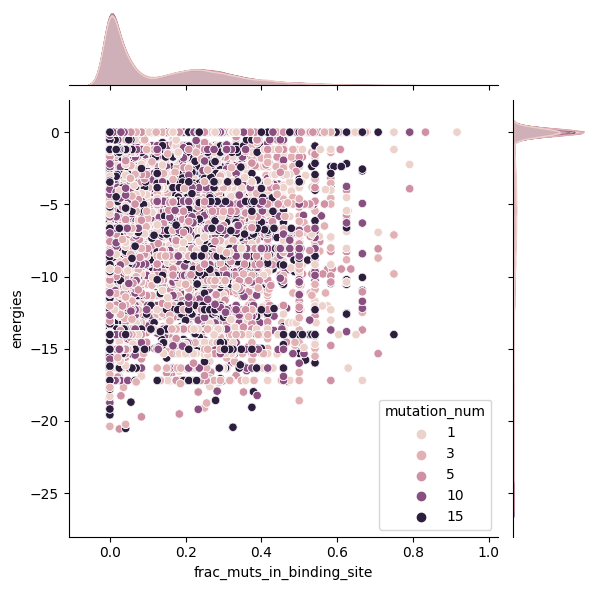

In [73]:
sns.jointplot(infom[infom['mutation_num'] > 0], x='frac_muts_in_binding_site', y='energies', hue='mutation_num')

A look at std's

In [108]:
v = infom.groupby(['circuit_name', 'mutation_num', 'sample_name'], as_index=False).agg(
    {'frac_muts_in_binding_site': ['std', 'mean']})
info_summ[('frac_muts_in_binding_site', 'std')] = v[('frac_muts_in_binding_site', 'std')]
info_summ[('frac_muts_in_binding_site', 'mean')] = v[('frac_muts_in_binding_site', 'mean')]



In [109]:
info_summ

circuit_name mutation_num sample_name fold_change            \
                                                               std      mean   
0      toy_mRNA_circuit_10000            0       RNA_0    0.000000  1.736741   
1      toy_mRNA_circuit_10000            0       RNA_1    0.000000  1.016215   
2      toy_mRNA_circuit_10000            0       RNA_2    0.000000  0.739559   
3      toy_mRNA_circuit_10000            1       RNA_0    0.161323  1.650666   
4      toy_mRNA_circuit_10000            1       RNA_1    0.026252  0.994271   
...                       ...          ...         ...         ...       ...   
17995  toy_mRNA_circuit_36038           10       RNA_1    0.152300  0.781428   
17996  toy_mRNA_circuit_36038           10       RNA_2    0.066798  0.960738   
17997  toy_mRNA_circuit_36038           15       RNA_0    0.266467  1.668990   
17998  toy_mRNA_circuit_36038           15       RNA_1    0.156830  0.847324   
17999  toy_mRNA_circuit_36038           15       RNA_2    0.058949  0.954849   

      overshoot                 RMSE            steady_states  ...  \
            std      mean        std       mean           std  ...   
0      0.000000  0.000000   0.000000   0.000000      0.000000  ...   
1      0.000000  0.765835   0.000000   0.000000      0.000000  ...   
2      0.000000  0.000000   0.000000   0.000000      0.000000  ...   
3      0.000000  0.000000  11.123427  11.007885     13.096681  ...   
4      0.374535  0.432944   8.190599   9.300694     11.652716  ...   
...         ...       ...        ...        ...           ...  ...   
17995  0.183307  0.038134  20.836476  22.528866     23.126561  ...   
17996  0.366079  0.245112  11.415295  11.059893     15.749360  ...   
17997  0.000000  0.000000   8.132069  19.557596     16.315735  ...   
17998  0.169547  0.035271  16.910828  27.051926     20.530799  ...   
17999  0.302196  0.113017   8.584000  14.779115     16.376718  ...   

      eqconstants           energies_diffs            \
              std      mean            std      mean   
0        0.075307  0.064679       0.000000  0.000000   
1        0.075307  0.064679       0.000000  0.000000   
2        0.075307  0.064679       0.000000  0.000000   
3        0.299120  0.071526       2.117065  0.551574   
4        0.299120  0.071526       2.117065  0.551574   
...           ...       ...            ...       ...   
17995    0.155062  0.056823       2.596163  0.972130   
17996    0.155062  0.056823       2.596163  0.972130   
17997    0.716710  0.116875       2.959799  1.162500   
17998    0.716710  0.116875       2.959799  1.162500   
17999    0.716710  0.116875       2.959799  1.162500   

      binding_rates_dissociation_diffs           eqconstants_diffs            \
                                   std      mean               std      mean   
0                             0.000000  0.000000          0.000000  0.000000   
1                             0.000000  0.000000          0.000000  0.000000   
2                             0.000000  0.000000          0.000000  0.000000   
3                             0.129963  0.039651          0.299888  0.006847   
4                             0.129963  0.039651          0.299888  0.006847   
...                                ...       ...               ...       ...   
17995                         0.184559  0.082297          0.140235 -0.000304   
17996                         0.184559  0.082297          0.140235 -0.000304   
17997                         0.190706  0.100412          0.715568  0.059747   
17998                         0.190706  0.100412          0.715568  0.059747   
17999                         0.190706  0.100412          0.715568  0.059747   

      frac_muts_in_binding_site            
                            std      mean  
0                           NaN  0.000000  
1                           NaN  0.000000  
2                           NaN  0.000000  
3                      0.161958  0.133565  
4                      0.161958

In [114]:
cols_to_norm = [
    'binding_rates_dissociation_diffs',
    'energies_diffs',
    'eqconstants_diffs',
]
for c in cols_to_norm:
    info_summ[(c, 'std_normed_by_mean')] = info_summ[(c, 'std')] / info_summ[(c, 'mean')]

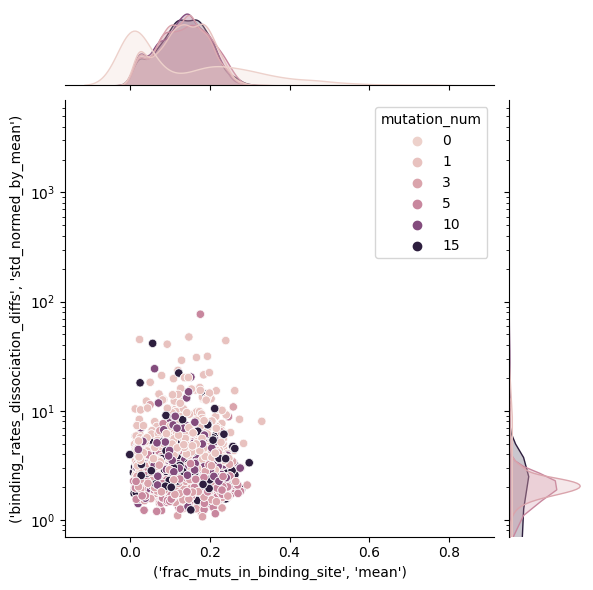

In [117]:
sns.jointplot(info_summ, x=('frac_muts_in_binding_site', 'mean'), y=('binding_rates_dissociation_diffs', 'std_normed_by_mean'), hue='mutation_num')
plt.yscale('log')

<AxesSubplot: xlabel="('frac_muts_in_binding_site', 'mean')", ylabel="('RMSE', 'mean')">

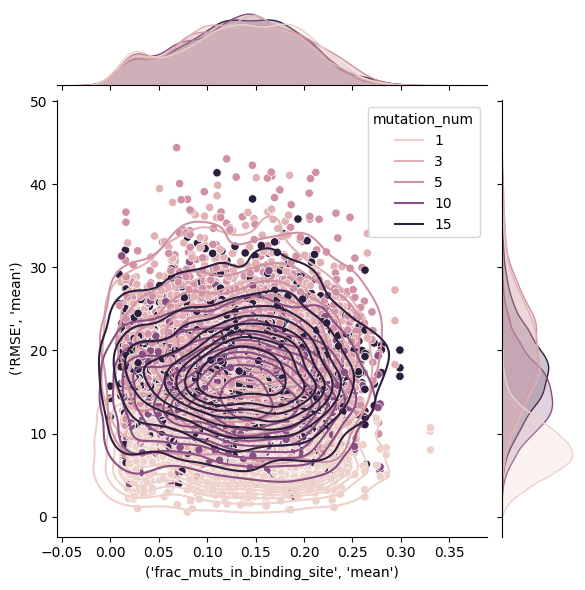

In [79]:
sns.jointplot(info_summ[info_summ['mutation_num'] > 0], x=('frac_muts_in_binding_site', 'mean'), y=('RMSE', 'mean'), hue='mutation_num')
sns.kdeplot(info_summ[info_summ['mutation_num'] > 0], x=('frac_muts_in_binding_site', 'mean'), y=('RMSE', 'mean'), hue='mutation_num')